In [1]:
import os 
import matplotlib.pyplot as plt
import glob
import numpy as np
import random

In [2]:
import torch
from torch import nn
import torchvision
from torchvision import transforms
from torchvision.utils import make_grid
from tqdm.auto import tqdm
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from PIL import Image

torch.manual_seed(random.randint(1,1000))

## Modified U-Net (G_edit)

In [3]:
class ImageDataset(Dataset):
    def __init__(self,root_gt,root_masked,root_binary,transform=None):
        self.transform = transform
        self.files_gt = sorted(glob.glob(root_gt+"/*"+"/*.*"))
        self.files_masked = sorted(glob.glob(root_masked+"/*"+"/*.*"))
        self.files_binary = sorted(glob.glob(root_binary+"/*"+"/*.*"))
        
    def __getitem__(self,index):
        item_gt = self.transform(Image.open(self.files_gt[index%len(self.files_gt)]))
        item_masked = self.transform(Image.open(self.files_masked[index%len(self.files_masked)]))
        item_binary = self.transform(Image.open(self.files_binary[index%len(self.files_binary)]).convert("RGB"))
        return (item_gt-0.5)*2,(item_masked-0.5)*2,(item_binary-0.5)*2
    
    def __len__(self):
        return min(len(self.files_masked),len(self.files_binary))
    

In [4]:
def crop(image,new_shape):
    middle_height = image.shape[2]//2
    middle_width = image.shape[3]//2
    starting_height = middle_height-round(new_shape[2]/2)
    final_height = starting_height+new_shape[2]
    starting_width = middle_width-round(new_shape[3]/2)
    final_width = starting_width+new_shape[3]
    cropped_image = image[:,:,starting_height:final_height,starting_width:final_width]
    return cropped_image

In [5]:
class ContractingBlock(nn.Module):
    def __init__(self,input_channels,use_in=True,use_dropout=False):
        super(ContractingBlock,self).__init__()
        self.conv = nn.Conv2d(input_channels,input_channels*2,kernel_size=3,padding=1)
        self.activation = nn.LeakyReLU(0.2)
        self.maxpool = nn.MaxPool2d(kernel_size=2,stride=2)
        if use_in:
            self.insnorm = nn.InstanceNorm2d(input_channels*2)
        self.use_in = use_in
        if use_dropout:
            self.drop = nn.Dropout()
        self.use_dropout = use_dropout
    
    def forward(self,x):
        x = self.conv(x)
        if self.use_in:
            x = self.insnorm(x)
        if self.use_dropout:
            x = self.drop(x)
        x = self.activation(x)
        x = self.maxpool(x)
        return x

    
class ExpandingBlock(nn.Module):
    def __init__(self,input_channels,use_in=True):
        super(ExpandingBlock,self).__init__()
        self.tconv = nn.ConvTranspose2d(input_channels,input_channels//2,kernel_size=3,stride=2,padding=1,output_padding=1)
        self.conv2 = nn.Conv2d(input_channels,input_channels//2,kernel_size=3,padding=1)
        self.activation = nn.LeakyReLU(0.2)
        if use_in:
            self.insnorm = nn.InstanceNorm2d(input_channels//2)
        self.use_in = use_in
        
    def forward(self,x,skip_x):
        x = self.tconv(x)
        skip_x = crop(skip_x,x.shape)
        x = torch.cat([x,skip_x],axis=1)
        x = self.conv2(x)
        if self.use_in:
            x = self.insnorm(x)
        x = self.activation(x)
        return x
    
    
class FeatureMapBlock(nn.Module):
    def __init__(self,input_channels,output_channels):
        super(FeatureMapBlock,self).__init__()
        self.conv = nn.Conv2d(input_channels,output_channels,kernel_size=1)
        
    def forward(self,x):
        x = self.conv(x)
        return x
    
    
class SE_Block(nn.Module):
    def __init__(self,channels,reduction=16):
        super(SE_Block,self).__init__()
        self.squeeze = nn.AdaptiveAvgPool2d(1)
        self.excitation = nn.Sequential(
            nn.Linear(channels,channels//reduction,bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channels//reduction,channels,bias=False),
            nn.Sigmoid()
        )
    def forward(self,x):
        b, c, _, _ = x.shape
        y = self.squeeze(x).view(b,c)
        y = self.excitation(y).view(b,c,1,1)
        return x * y.expand_as(x)
    
    
class AtrousConv(nn.Module):
    def __init__(self,input_channels):
        super(AtrousConv,self).__init__()
        self.aconv2 = nn.Conv2d(input_channels,input_channels,kernel_size=3,stride=1,dilation=2,padding=2)
        self.aconv4 = nn.Conv2d(input_channels,input_channels,kernel_size=3,stride=1,dilation=4,padding=4)
        self.aconv8 = nn.Conv2d(input_channels,input_channels,kernel_size=3,stride=1,dilation=8,padding=8)
        self.aconv16 = nn.Conv2d(input_channels,input_channels,kernel_size=3,stride=1,dilation=16,padding=16)
        self.batchnorm = nn.BatchNorm2d(input_channels)
        self.activation = nn.ReLU()
        
    def forward(self,x):
        x = self.aconv2(x)
        x = self.batchnorm(x)
        x = self.activation(x)
        
        x = self.aconv4(x)
        x = self.batchnorm(x)
        x = self.activation(x)
        
        x = self.aconv8(x)
        x = self.batchnorm(x)
        x = self.activation(x)
        
        x = self.aconv16(x)
        x = self.batchnorm(x)
        x = self.activation(x)
        
        return x
    

In [6]:
class UNet(nn.Module):
    def __init__(self,input_channels,output_channels,hidden_channels=32):
        super(UNet,self).__init__()
        self.upfeature = FeatureMapBlock(input_channels,hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels,use_in=False,use_dropout=True)
        self.contract2 = ContractingBlock(hidden_channels*2,use_dropout=True)
        self.contract3 = ContractingBlock(hidden_channels*4,use_dropout=True)
        self.contract4 = ContractingBlock(hidden_channels*8)
        self.contract5 = ContractingBlock(hidden_channels*16)
        
        self.atrous_conv = AtrousConv(hidden_channels*32)
        
        self.expand0 = ExpandingBlock(hidden_channels*32)
        self.expand1 = ExpandingBlock(hidden_channels*16)
        self.expand2 = ExpandingBlock(hidden_channels*8)
        self.expand3 = ExpandingBlock(hidden_channels*4)
        self.expand4 = ExpandingBlock(hidden_channels*2)
        self.downfeature = FeatureMapBlock(hidden_channels,output_channels)
        
        self.se1 = SE_Block(hidden_channels*2)
        self.se2 = SE_Block(hidden_channels*4)
        self.se3 = SE_Block(hidden_channels*8)
        
        self.tanh = torch.nn.Tanh()
        
        
    def forward(self,x):
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x1 = self.se1(x1)
        x2 = self.contract2(x1)
        x2 = self.se2(x2)
        x3 = self.contract3(x2)
        x3 = self.se3(x3)
        x4 = self.contract4(x3)
        x5 = self.contract5(x4)
        x5 = self.atrous_conv(x5)
        x6 = self.expand0(x5,x4)
        x7 = self.expand1(x6,x3)
        x8 = self.expand2(x7,x2)
        x9 = self.expand3(x8,x1)
        x10 = self.expand4(x9,x0)
        xn = self.downfeature(x10)
        
        return self.tanh(xn)

## Discriminator (whole region)

In [7]:
class Discriminator_whole(nn.Module):
    def __init__(self,input_channels,hidden_channels=8):
        super(Discriminator_whole,self).__init__()
        self.upfeature = FeatureMapBlock(input_channels,hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels,use_in=False)
        self.contract2 = ContractingBlock(hidden_channels*2)
        self.contract3 = ContractingBlock(hidden_channels*4)
        self.contract4 = ContractingBlock(hidden_channels*8)
        self.final = nn.Conv2d(hidden_channels*16,1,kernel_size=1)  
        
    def forward(self,x,y):
        x = torch.cat([x,y],axis=1)
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        xn = self.final(x4)
        return xn

## Discriminator (mask region)

In [8]:
class Discriminator_mask(nn.Module):
    def __init__(self,input_channels,hidden_channels=8):
        super(Discriminator_mask,self).__init__()
        self.upfeature = FeatureMapBlock(input_channels,hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels,use_in=False)
        self.contract2 = ContractingBlock(hidden_channels*2)
        self.contract3 = ContractingBlock(hidden_channels*4)
        self.contract4 = ContractingBlock(hidden_channels*8)
        self.final = nn.Conv2d(hidden_channels*16,1,kernel_size=1) 
        self.dropout = nn.Dropout()
        
    def forward(self,x,y): 
        x = torch.cat([x,y],axis=1)
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x2 = self.dropout(x2)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        xn = self.final(x4)
        return xn

### Parameters

In [9]:
import torch.nn.functional as F
adv_criterion = nn.BCEWithLogitsLoss()
#adv_criterion = nn.MSELoss()
recon_criterion = nn.L1Loss()
lambda_recon = 100
lambda_Dwhole = 0.3
lambda_Dmask = 0.7
lambda_adv_whole = 0.3
lambda_adv_mask = 0.7

n_epochs=1
input_dim = 6
output_dim = 3
disc_dim = 9
display_step = 879     # 10548img/3batch / 4
batch_size = 3
lr = 0.0003
target_shape = 224
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor()
])

gt_root = "unmasked_dataset2"      ### change ###
masked_root = "masked_dataset2"    ### change ###
binary_root = "binary_dataset2"    ### change ###
dataset = ImageDataset(gt_root,masked_root,binary_root,transform=transform)

In [10]:
gen = UNet(input_dim,output_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(),lr=lr)

disc_whole = Discriminator_whole(disc_dim).to(device)
disc_whole_opt = torch.optim.Adam(disc_whole.parameters(),lr=0.0001)

disc_mask = Discriminator_mask(disc_dim).to(device)
disc_mask_opt = torch.optim.Adam(disc_mask.parameters(),lr=0.0001)

def weights_init(m):
    if isinstance(m,nn.Conv2d) or isinstance(m,nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight,0.0,0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

pretrained = True     ##change##
if pretrained:
    loaded_state = torch.load("Inpaint_UNet_52745.pth")         ##change##
    gen.load_state_dict(loaded_state["gen"])
    gen_opt.load_state_dict(loaded_state["gen_opt"])
    disc_whole.load_state_dict(loaded_state["disc_whole"])
    disc_whole_opt.load_state_dict(loaded_state["disc_whole_opt"])
    disc_mask.load_state_dict(loaded_state["disc_mask"])
    disc_mask_opt.load_state_dict(loaded_state["disc_mask_opt"])
else:
    gen = gen.apply(weights_init)
    disc_whole = disc_whole.apply(weights_init)
    disc_mask = disc_mask.apply(weights_init)

In [11]:
def normalize(img):
    return (img-(-1))/(1-(-1))
def anti_normalize(img):
    return img*(1-(-1))+(-1)

## Loss terms

#### Reconstruction Loss (L_l1+L_ssim)

In [12]:
import torch
import torch.nn.functional as F
from torch.autograd import Variable
import numpy as np
from math import exp

In [13]:
def gaussian(window_size, sigma):
    gauss = torch.Tensor([exp(-(x - window_size//2)**2/float(2*sigma**2)) for x in range(window_size)])
    return gauss/gauss.sum()

def create_window(window_size, channel):
    _1D_window = gaussian(window_size, 1.5).unsqueeze(1)
    _2D_window = _1D_window.mm(_1D_window.t()).float().unsqueeze(0).unsqueeze(0)
    window = Variable(_2D_window.expand(channel, 1, window_size, window_size).contiguous())
    return window

def _ssim(img1, img2, window, window_size, channel, size_average = True):
    mu1 = F.conv2d(img1, window, padding = window_size//2, groups = channel)
    mu2 = F.conv2d(img2, window, padding = window_size//2, groups = channel)

    mu1_sq = mu1.pow(2)
    mu2_sq = mu2.pow(2)
    mu1_mu2 = mu1*mu2

    sigma1_sq = F.conv2d(img1*img1, window, padding = window_size//2, groups = channel) - mu1_sq
    sigma2_sq = F.conv2d(img2*img2, window, padding = window_size//2, groups = channel) - mu2_sq
    sigma12 = F.conv2d(img1*img2, window, padding = window_size//2, groups = channel) - mu1_mu2

    C1 = 0.01**2
    C2 = 0.03**2

    ssim_map = ((2*mu1_mu2 + C1)*(2*sigma12 + C2))/((mu1_sq + mu2_sq + C1)*(sigma1_sq + sigma2_sq + C2))

    if size_average:
        return ssim_map.mean()
    else:
        return ssim_map.mean(1).mean(1).mean(1)


In [14]:
class SSIM(torch.nn.Module):
    def __init__(self, window_size = 11, size_average = True):
        super(SSIM, self).__init__()
        self.window_size = window_size
        self.size_average = size_average
        self.channel = 1
        self.window = create_window(window_size, self.channel)

    def forward(self, img1, img2):
        ###
        img1 = (img1+1)/2
        img2 = (img2+1)/2
        ###
        (_, channel, _, _) = img1.size()

        if channel == self.channel and self.window.data.type() == img1.data.type():
            window = self.window
        else:
            window = create_window(self.window_size, channel)
            
            if img1.is_cuda:
                window = window.cuda(img1.get_device())
            window = window.type_as(img1)
            
            self.window = window
            self.channel = channel


        return _ssim(img1, img2, window, self.window_size, channel, self.size_average)

In [15]:
def recon_loss(gt,fake,recon_criterion):
    ssim = SSIM()
    ssim_loss = ssim(gt,fake)
    l1_loss = recon_criterion(gt,fake)
    return l1_loss,ssim_loss

#### Perceptual loss

In [16]:
from torchvision.models import vgg19

class PerceptualNet(nn.Module):
    def __init__(self, name = "vgg19", resize=True):
        super(PerceptualNet, self).__init__()
        blocks = []
        blocks.append(vgg19(pretrained=True).features[:4].eval())
        blocks.append(vgg19(pretrained=True).features[4:9].eval())
        blocks.append(vgg19(pretrained=True).features[9:16].eval())
        blocks.append(vgg19(pretrained=True).features[16:23].eval())
        
        for bl in blocks:
            for p in bl:
                p.requires_grad = False
        self.blocks = torch.nn.ModuleList(blocks).to(device)
        self.transform = torch.nn.functional.interpolate
        self.mean = torch.nn.Parameter(torch.tensor([0.485, 0.456, 0.406]).view(1,3,1,1)).to(device)
        self.std = torch.nn.Parameter(torch.tensor([0.229, 0.224, 0.225]).view(1,3,1,1)).to(device)
        self.resize = resize
    
    def forward(self, inputs, targets):
        if inputs.shape[1] != 3:
            inputs = inputs.repeat(1, 3, 1, 1)
            targets = targets.repeat(1, 3, 1, 1)
        inputs = (inputs+1)/2
        targets = (targets+1)/2
        if self.resize:
            inputs = self.transform(inputs, mode='bilinear', size=(224, 224), align_corners=False)
            targets = self.transform(targets, mode='bilinear', size=(224, 224), align_corners=False)
        loss = 0.0
        x = inputs
        y = targets
        for block in self.blocks:
            x = block(x)
            y = block(y)
            loss += torch.nn.functional.l1_loss(x, y)
        return loss


def percep_loss(gt,fake):
    percep_net = PerceptualNet()
    return percep_net(gt,fake)


#### Discriminators Loss

In [17]:
def discwhole_loss_func(disc_whole,gt,mask,binary,fake,adv_criterion,lambda_Dwhole):
    input_imgs = torch.cat((mask,binary),1)
    fake_pred = disc_whole(fake.detach(),input_imgs)
    gt_pred = disc_whole(gt,input_imgs)
    fake_loss = adv_criterion(fake_pred,torch.zeros_like(fake_pred))
    gt_loss = adv_criterion(gt_pred,torch.ones_like(gt_pred))
    return lambda_Dwhole * (fake_loss+gt_loss)/2


def discmask_loss_func(disc_mask, gt,fake,mask,binary, adv_criterion, lambda_Dmask): 
    nor_mask = normalize(mask)
    nor_binary = normalize(binary)
    nor_fake = normalize(fake)
    
    oofs = torch.mul(nor_mask,1-nor_binary)
    oops = torch.mul(nor_fake,nor_binary)
    ooo = anti_normalize(oofs+oops)
    input_imgs = torch.cat((mask,binary),1)
    fake_pred = disc_mask(ooo.detach(),input_imgs)
    gt_pred = disc_mask(gt,input_imgs)
    
    fake_loss = adv_criterion(fake_pred,torch.zeros_like(fake_pred))
    gt_loss = adv_criterion(gt_pred,torch.ones_like(gt_pred))
    
    return lambda_Dmask * (fake_loss+gt_loss)/2

#### Generator Loss

In [18]:
def gen_adv_loss(gen,disc, gt,mask,binary, adv_criterion):
    input_imgs = torch.cat((mask,binary),1)
    fake = gen(input_imgs)
    fake_pred = disc(fake,input_imgs)
    adv_loss = adv_criterion(fake_pred,torch.ones_like(fake_pred))
    return adv_loss,fake

In [19]:
def generator_loss(cur_step,gen,disc_whole,disc_mask, gt,mask,binary,
                  adv_criterion,recon_criterion,
                  lambda_recon,lambda_adv_whole,lambda_adv_mask):
    if cur_step<3516*6:
        adver_loss_whole,fake = gen_adv_loss(gen,disc_whole,gt,mask,binary,adv_criterion)
        l1_loss,ssim_loss = recon_loss(gt,fake,recon_criterion)
        reconstruction_loss = l1_loss*0.5 + (1-ssim_loss)*0.5
        perceptual_loss = percep_loss(gt,fake)
        gen_loss = lambda_recon*(reconstruction_loss+perceptual_loss)+lambda_adv_whole*adver_loss_whole
    else:
        adver_loss_whole,fake = gen_adv_loss(gen,disc_whole,gt,mask,binary,adv_criterion)
        adver_loss_mask,fake = gen_adv_loss(gen,disc_mask,gt,mask,binary,adv_criterion)
        l1_loss,ssim_loss = recon_loss(gt,fake,recon_criterion)
        reconstruction_loss = l1_loss*0.5 + (1-ssim_loss)*0.5
        perceptual_loss = percep_loss(gt,fake)
        gen_loss = lambda_recon*(reconstruction_loss+perceptual_loss)+lambda_adv_whole*adver_loss_whole+lambda_adv_mask*adver_loss_mask
    
    
    return gen_loss,fake,l1_loss,ssim_loss,perceptual_loss

## FID

In [20]:
from torchvision.models import inception_v3
import scipy.linalg
import numpy as np

inception_model = inception_v3(pretrained=True)
inception_model.to(device)
inception_model = inception_model.eval() # Evaluation mode
inception_model.fc = torch.nn.Identity()

def matrix_sqrt(x):
    y = x.cpu().detach().numpy()
    y = scipy.linalg.sqrtm(y)
    return torch.Tensor(y.real,device=x.device)

def frechet_distance(mu_x,mu_y,sigma_x,sigma_y):
    return torch.norm(mu_x-mu_y)**2 + torch.trace(sigma_x+sigma_y-2*matrix_sqrt(sigma_x@sigma_y))

def get_covariance(features):
    return torch.Tensor(np.cov(features.detach().numpy(),rowvar=False))


## Model Training

In [21]:
def show_tensor_images(image_tensor, num_images=3, size=(3,224,224)):
    image_tensor = (image_tensor + 1) / 2
    image_shifted = image_tensor
    image_unflat = image_shifted.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [22]:
def train(save_model=False):
    mean_generator_loss = 0
    mean_disc_whole_loss = 0
    mean_disc_mask_loss = 0
    fake_features_list = []
    real_features_list = []
    dataloader = DataLoader(dataset,batch_size=batch_size,shuffle=True)
    cur_step = 52745                     ##change##
    
    for epoch in range(1,n_epochs+1):
        for gt,mask,binary in tqdm(dataloader):
            gt = gt.to(device)
            mask = mask.to(device)
            binary = binary.to(device)
            
            with torch.no_grad():
                input_imgs = torch.cat((mask,binary),1)
                fake = gen(input_imgs)
                
            real_features = inception_model(gt.to(device)).detach().to('cpu')    #FID
            real_features_list.append(real_features)
            fake_features = inception_model(fake.to(device)).detach().to('cpu')
            fake_features_list.append(fake_features)
            
            if cur_step%5==0:
                disc_whole_opt.zero_grad()
                disc_whole_loss = discwhole_loss_func(disc_whole,gt,mask,binary,fake,adv_criterion,lambda_Dwhole)
                disc_whole_loss.backward(retain_graph=True)
                disc_whole_opt.step()
                mean_disc_whole_loss += disc_whole_loss.item()/4
                
                if cur_step>=3516*6:
                    disc_mask_opt.zero_grad()
                    disc_mask_loss = discmask_loss_func(disc_mask,gt,fake,mask,binary,adv_criterion,lambda_Dmask)
                    disc_mask_loss.backward(retain_graph=True)
                    disc_mask_opt.step()
                    mean_disc_mask_loss += disc_mask_loss.item()/4
            
            
            gen_opt.zero_grad()
            gen_loss,fake,l1_loss,ssim_loss,perceptual_loss = generator_loss(cur_step,gen,disc_whole,disc_mask, 
                                                               gt,mask,binary,
                                                               adv_criterion,recon_criterion,
                                                               lambda_recon,lambda_adv_whole,lambda_adv_mask)
            gen_loss.backward()
            gen_opt.step()
            mean_generator_loss += gen_loss.item()/20
            
            
            if cur_step%20 == 0:
                fake_features_all = torch.cat(fake_features_list)            #FID
                real_features_all = torch.cat(real_features_list)
                mu_fake = fake_features_all.mean(dim=0)
                mu_real = real_features_all.mean(dim=0)
                sigma_fake = get_covariance(fake_features_all)
                sigma_real = get_covariance(real_features_all)
                FID = frechet_distance(mu_real,mu_fake,sigma_real,sigma_fake).item()
                
                fid_file = open('FID_epoch16','a')       ##change##
                fid_file.write(str(cur_step)+"\n")
                fid_file.write(str(round(FID,4))+"\n"+"\n")
                fid_file.close()
                fake_features_list.clear()
                real_features_list.clear()

                loss_file = open('loss_epoch16','a')     ##change##
                loss_file.write(str(cur_step)+"\n")
                loss_file.write(str(round(mean_generator_loss,4))+"    "+str(round(mean_disc_whole_loss,4))+"    "+str(round(mean_disc_mask_loss,4))+"    ")
                loss_file.write(str(round(l1_loss.item(),4))+"    "+str(round(1-ssim_loss.item(),4))+"    "+str(round(perceptual_loss.item(),4)))
                loss_file.write("\n"+"\n")
                loss_file.close()
                mean_generator_loss = 0
                mean_disc_whole_loss = 0
                mean_disc_mask_loss = 0
                
            if cur_step%display_step == 0:
                print(f"Epoch {epoch}: Step {cur_step}")
                show_tensor_images(gt,size=(3,target_shape,target_shape))
                show_tensor_images(mask,size=(3,target_shape,target_shape))
                show_tensor_images(fake,size=(3,target_shape,target_shape))
                
            cur_step += 1
            
        if save_model:
            torch.save({'gen':gen.state_dict(),
                       'gen_opt':gen_opt.state_dict(),
                       'disc_whole':disc_whole.state_dict(),
                       'disc_whole_opt':disc_whole_opt.state_dict(),
                       'disc_mask':disc_mask.state_dict(),
                       'disc_mask_opt':disc_mask_opt.state_dict()},
                      f"Inpaint_UNet_{cur_step}.pth")

In [23]:
import warnings
warnings.filterwarnings("ignore")

  0%|          | 0/3516 [00:00<?, ?it/s]

Epoch 1: Step 0


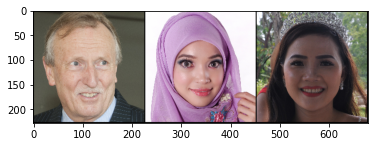

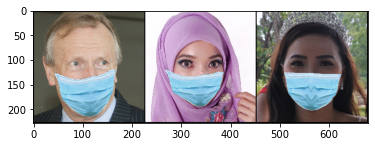

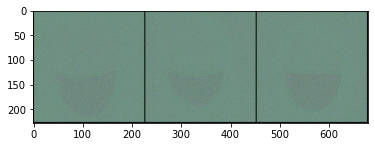

Epoch 1: Step 879


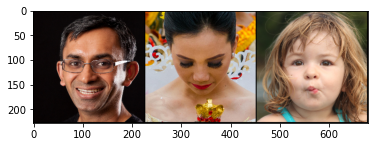

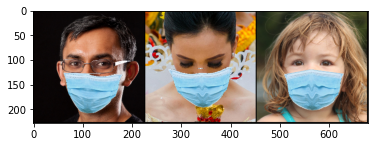

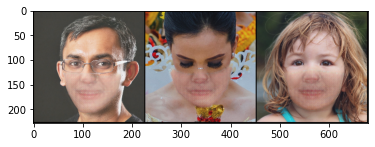

Epoch 1: Step 1758


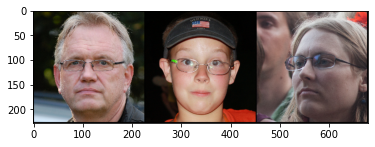

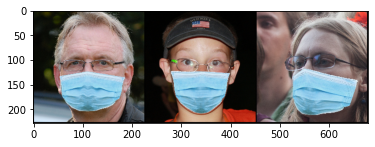

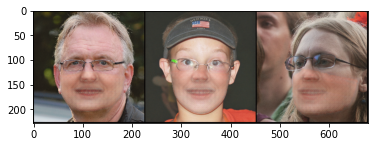

Epoch 1: Step 2637


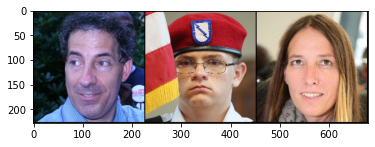

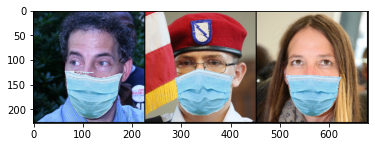

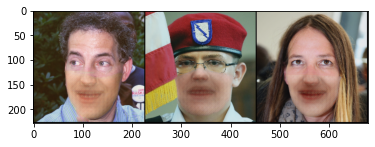

In [24]:
train(True)     # epoch 1

  0%|          | 0/3516 [00:00<?, ?it/s]

Epoch 1: Step 3516


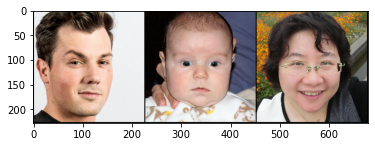

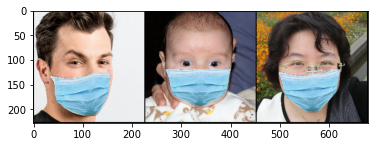

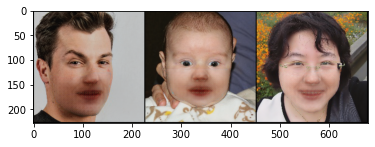

Epoch 1: Step 4395


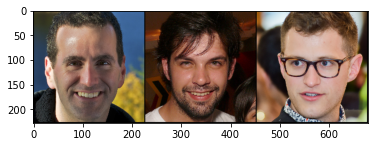

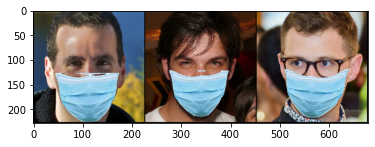

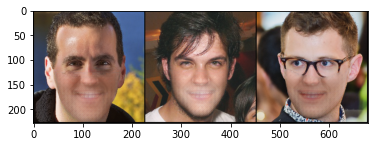

Epoch 1: Step 5274


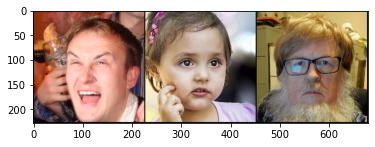

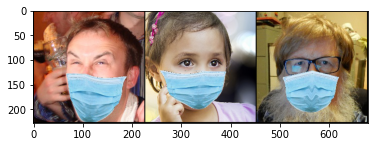

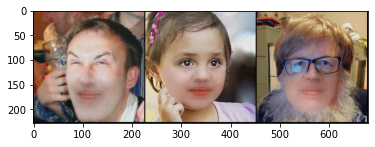

Epoch 1: Step 6153


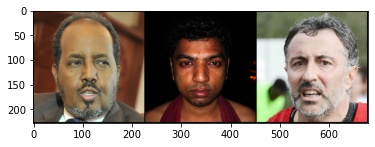

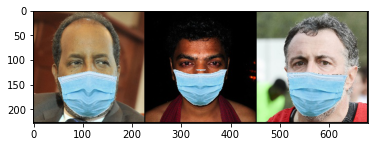

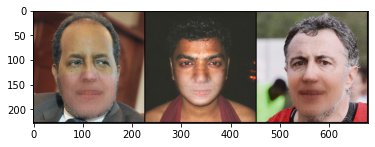

In [24]:
train(True)     #epoch 2

  0%|          | 0/3516 [00:00<?, ?it/s]

Epoch 1: Step 7032


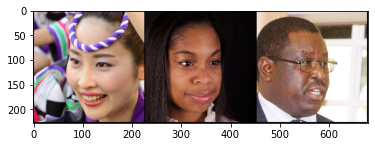

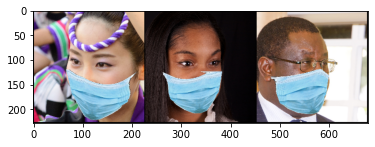

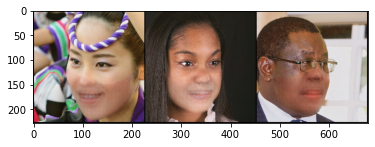

Epoch 1: Step 7911


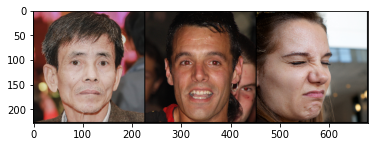

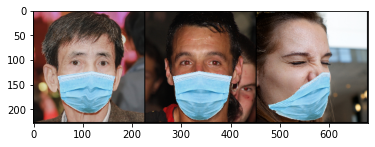

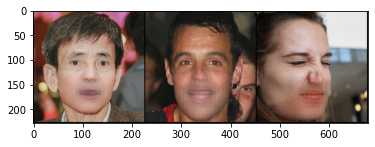

Epoch 1: Step 8790


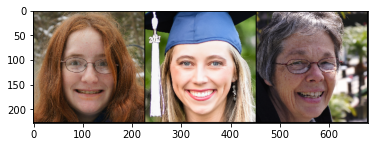

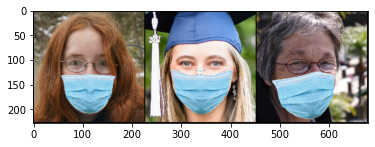

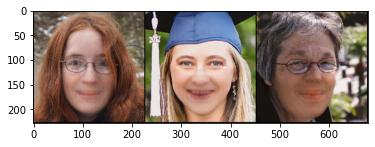

Epoch 1: Step 9669


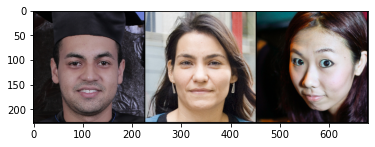

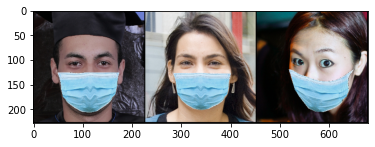

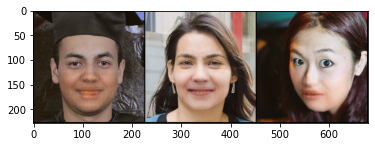

In [24]:
train(True)     # epoch 3

  0%|          | 0/3516 [00:00<?, ?it/s]

Epoch 1: Step 10548


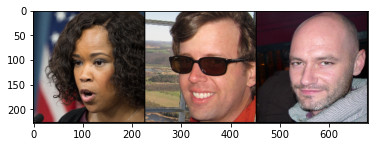

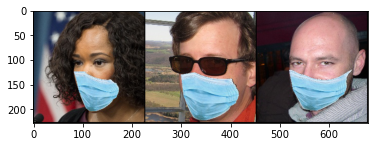

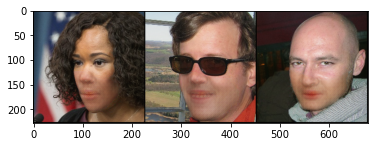

Epoch 1: Step 11427


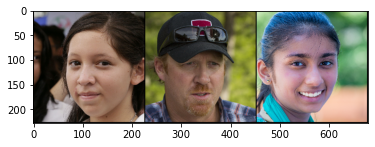

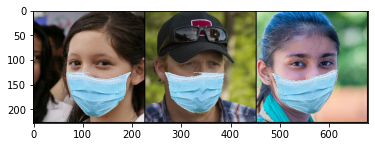

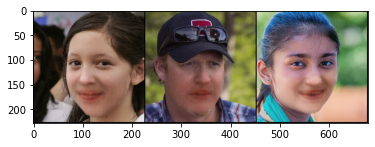

Epoch 1: Step 12306


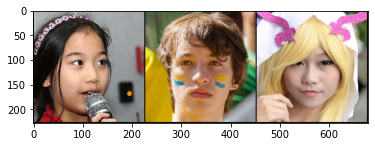

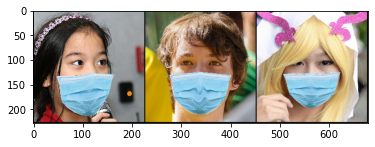

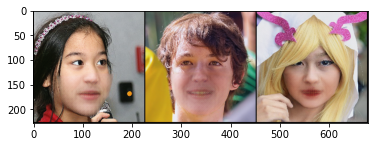

Epoch 1: Step 13185


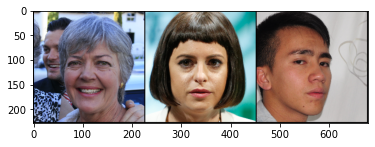

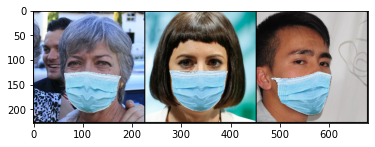

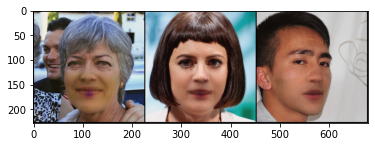

In [24]:
train(True)      # epoch 4

  0%|          | 0/3516 [00:00<?, ?it/s]

Epoch 1: Step 14064


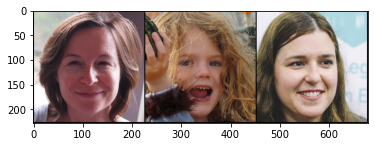

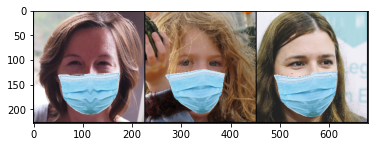

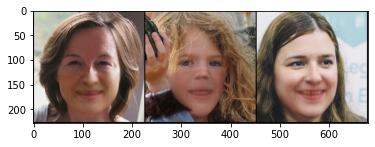

Epoch 1: Step 14943


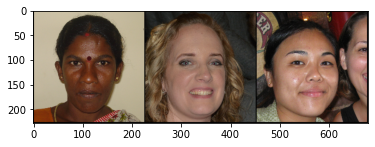

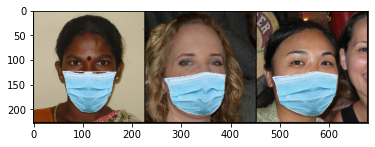

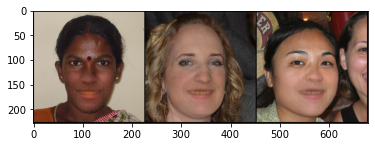

Epoch 1: Step 15822


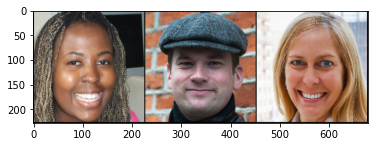

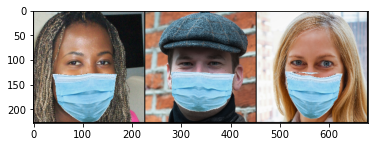

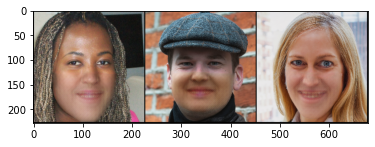

Epoch 1: Step 16701


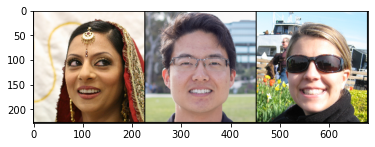

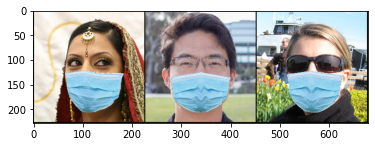

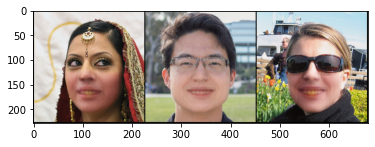

In [24]:
train(True)      # epoch 5

  0%|          | 0/3516 [00:00<?, ?it/s]

Epoch 1: Step 17580


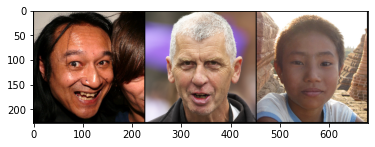

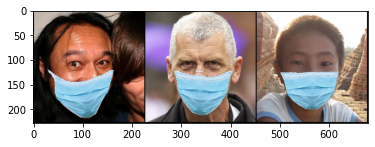

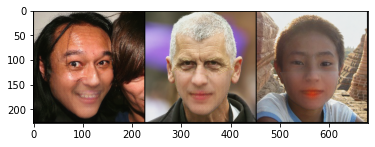

Epoch 1: Step 18459


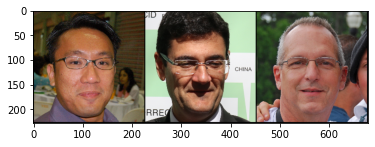

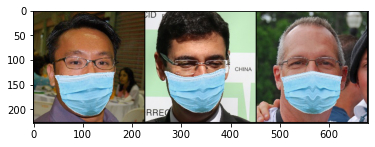

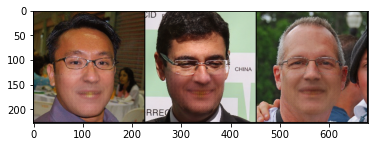

Epoch 1: Step 19338


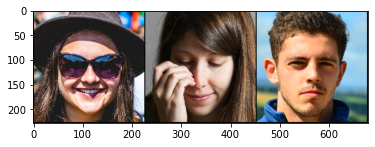

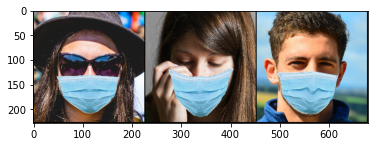

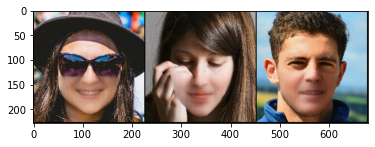

Epoch 1: Step 20217


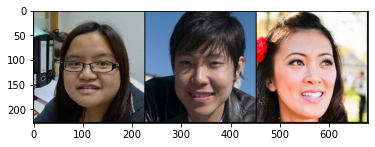

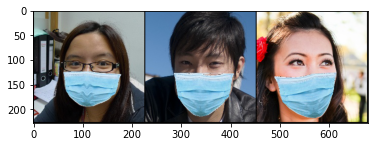

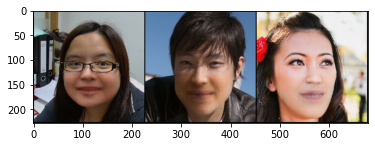

In [24]:
train(True)      # epoch 6

  0%|          | 0/3516 [00:00<?, ?it/s]

Epoch 1: Step 21096


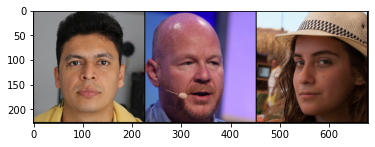

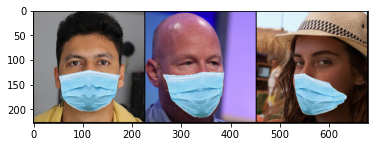

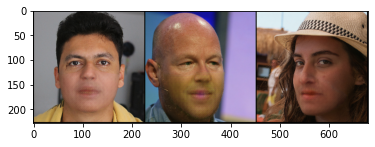

Epoch 1: Step 21975


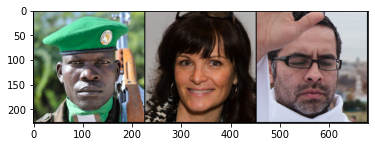

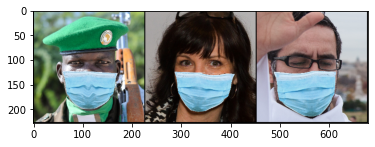

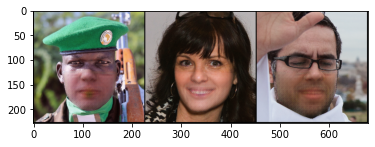

Epoch 1: Step 22854


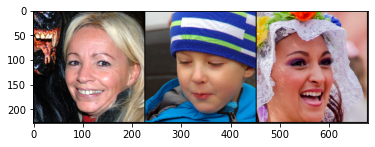

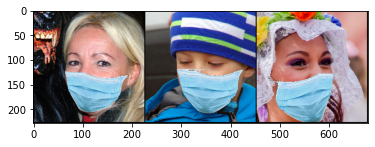

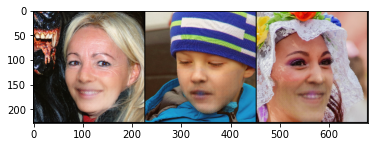

Epoch 1: Step 23733


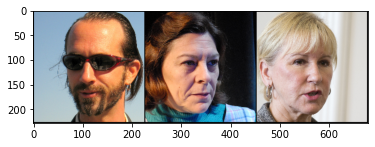

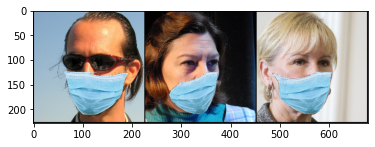

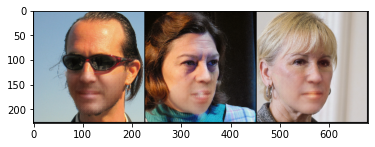

In [24]:
train(True)   # epoch7

  0%|          | 0/3516 [00:00<?, ?it/s]

Epoch 1: Step 24612


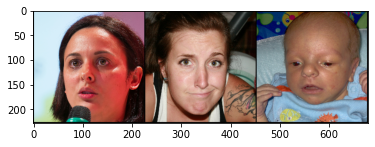

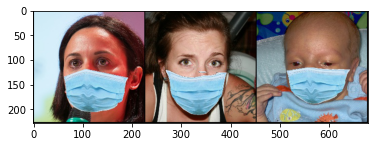

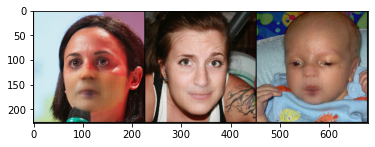

Epoch 1: Step 25491


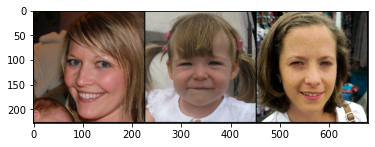

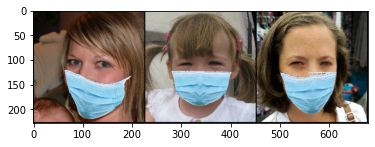

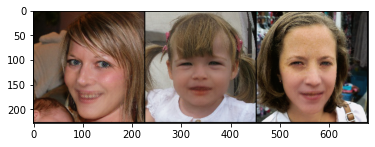

Epoch 1: Step 26370


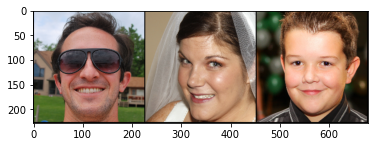

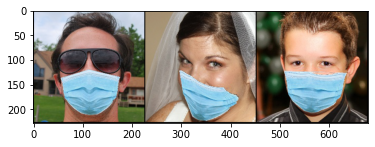

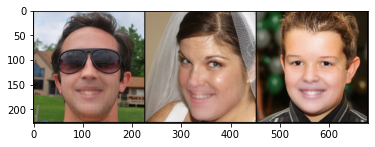

Epoch 1: Step 27249


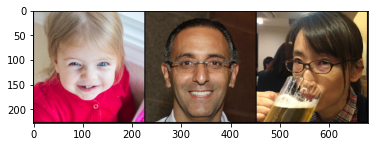

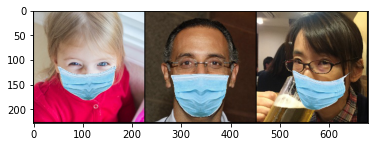

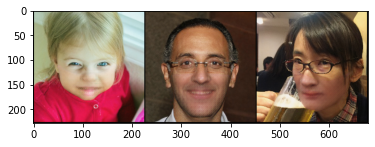

In [24]:
train(True)   # epoch8

  0%|          | 0/3516 [00:00<?, ?it/s]

Epoch 1: Step 28128


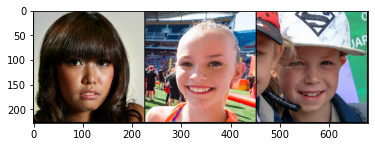

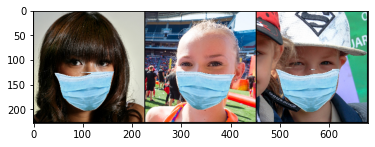

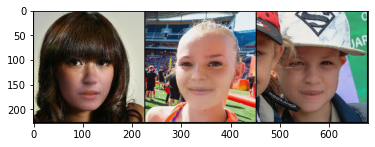

Epoch 1: Step 29007


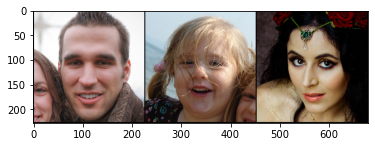

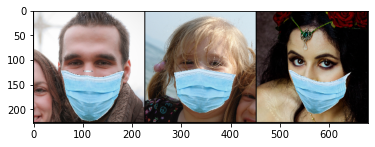

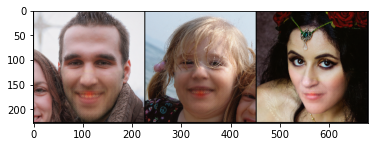

Epoch 1: Step 29886


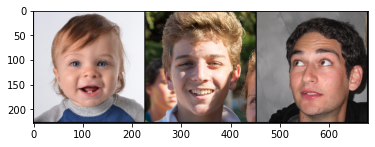

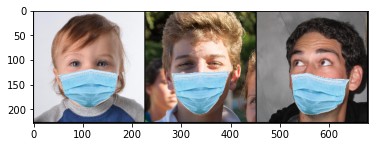

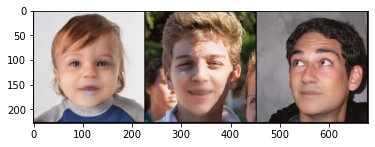

Epoch 1: Step 30765


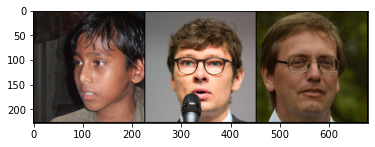

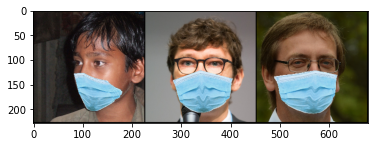

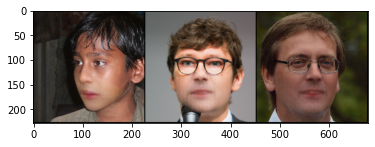

In [24]:
train(True)      # epoch9

  0%|          | 0/3516 [00:00<?, ?it/s]

Epoch 1: Step 31644


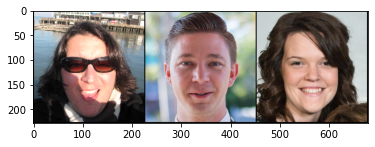

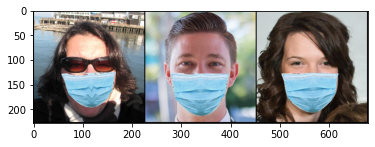

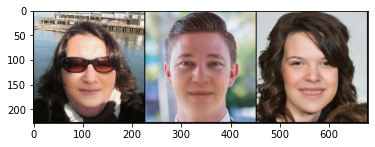

Epoch 1: Step 32523


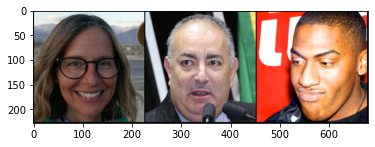

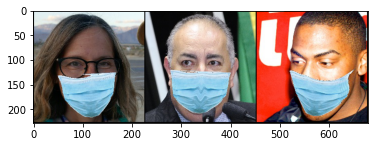

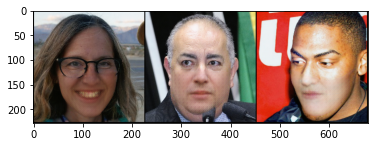

Epoch 1: Step 33402


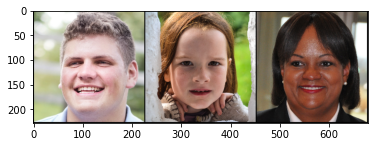

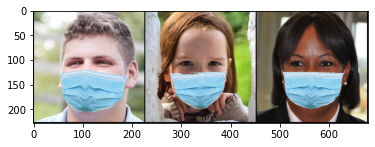

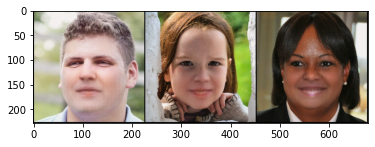

Epoch 1: Step 34281


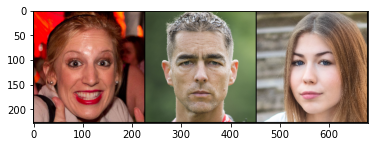

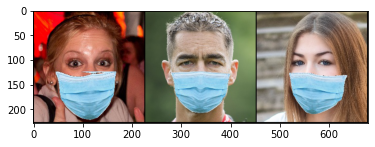

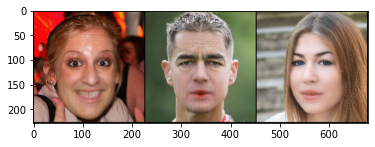

In [24]:
train(True)   #epoch10

  0%|          | 0/3516 [00:00<?, ?it/s]

Epoch 1: Step 35160


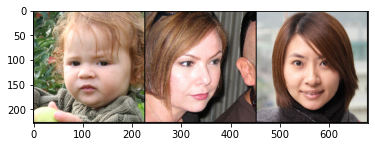

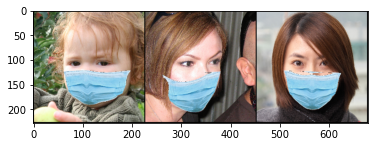

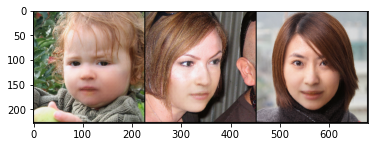

Epoch 1: Step 36039


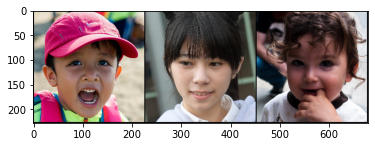

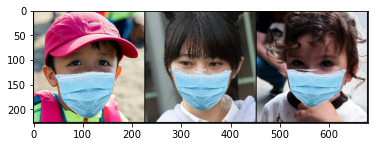

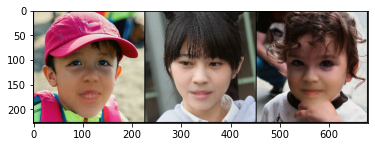

Epoch 1: Step 36918


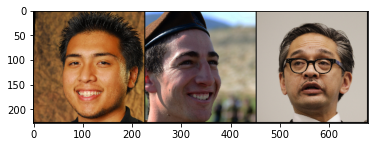

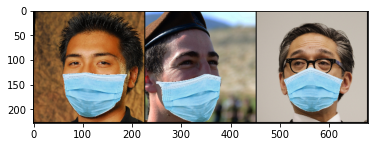

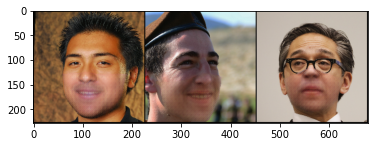

In [ ]:
train(True)   #epoch11

  0%|          | 0/3516 [00:00<?, ?it/s]

Epoch 1: Step 38676


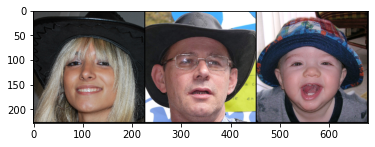

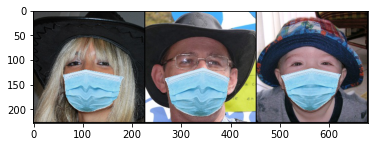

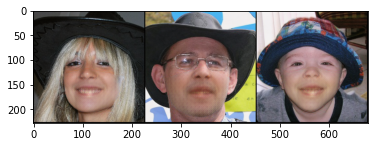

Epoch 1: Step 39555


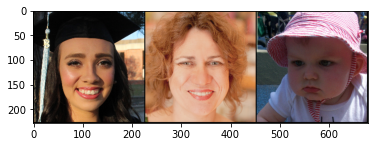

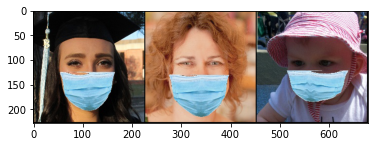

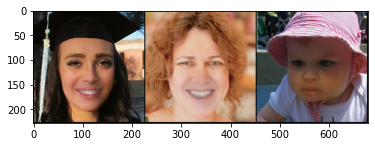

Epoch 1: Step 40434


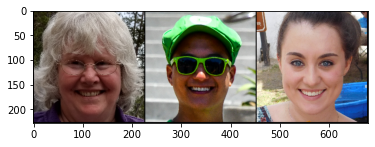

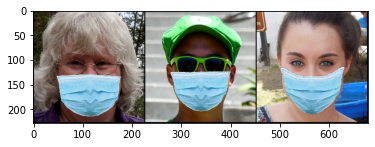

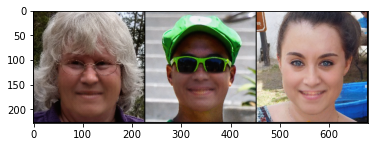

Epoch 1: Step 41313


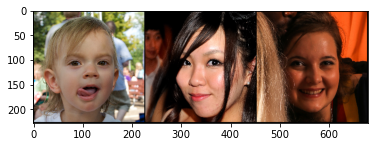

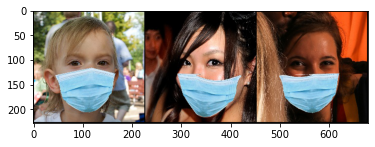

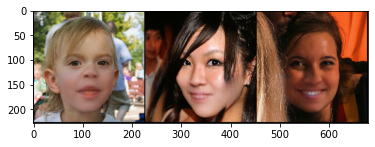

In [24]:
train(True)   #epoch12

  0%|          | 0/3518 [00:00<?, ?it/s]

Epoch 1: Step 42192


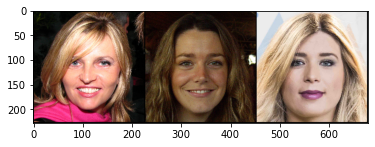

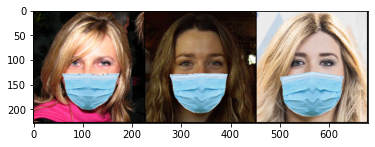

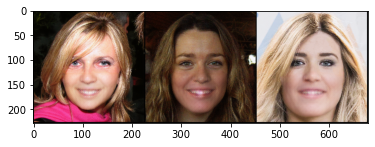

Epoch 1: Step 43071


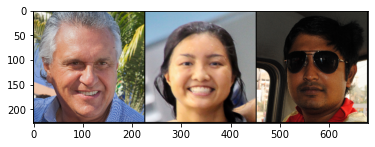

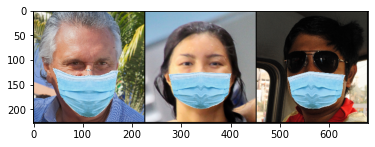

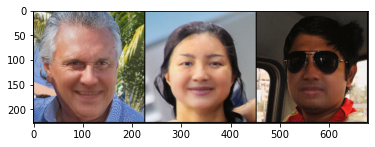

Epoch 1: Step 43950


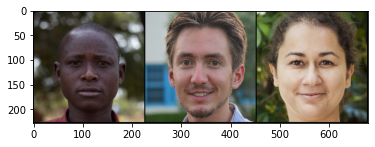

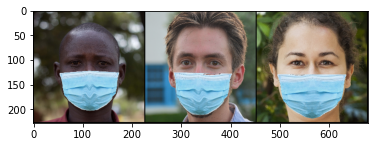

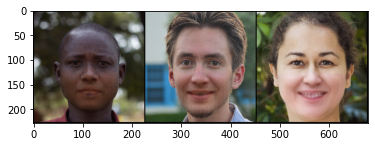

Epoch 1: Step 44829


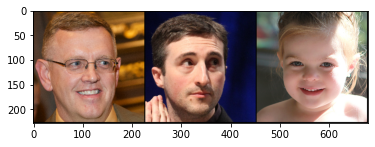

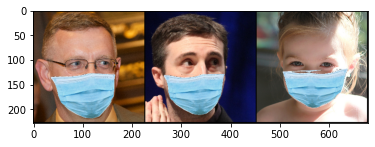

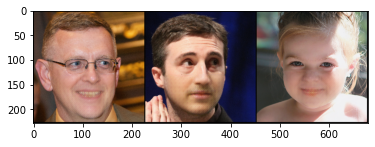

Epoch 1: Step 45708


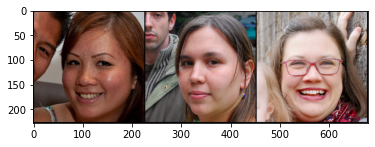

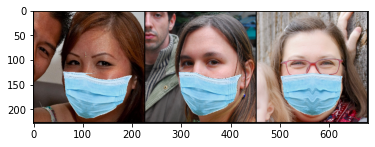

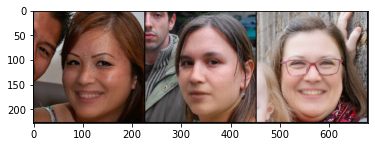

In [24]:
train(True)   #epoch13

  0%|          | 0/3517 [00:00<?, ?it/s]

Epoch 1: Step 46587


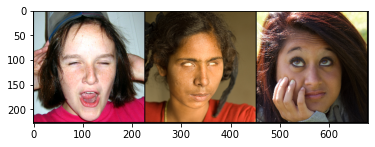

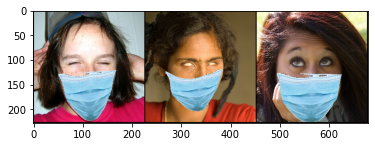

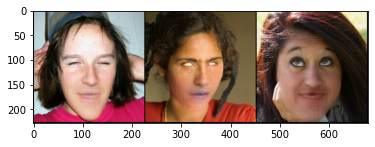

Epoch 1: Step 47466


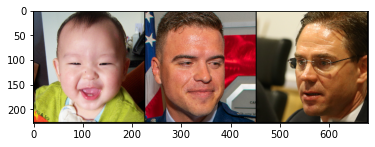

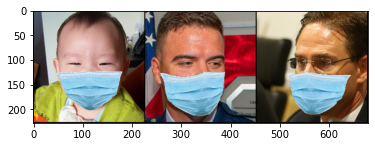

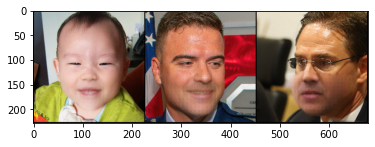

Epoch 1: Step 48345


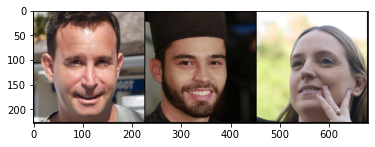

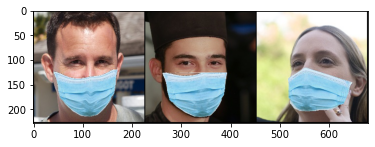

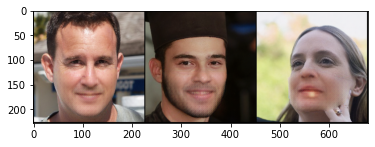

Epoch 1: Step 49224


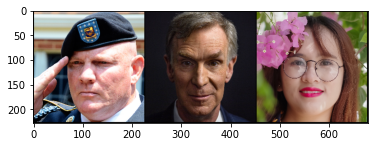

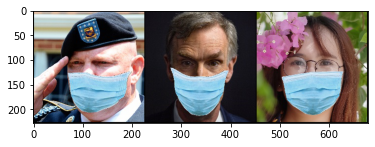

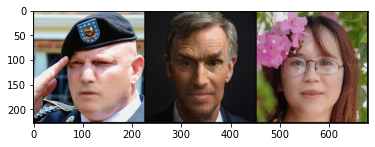

In [24]:
train(True)   #epoch14

  0%|          | 0/3518 [00:00<?, ?it/s]

Epoch 1: Step 50103


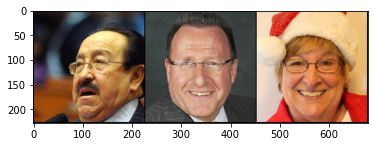

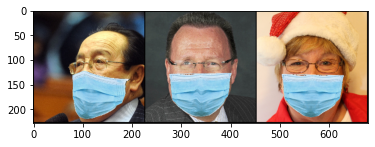

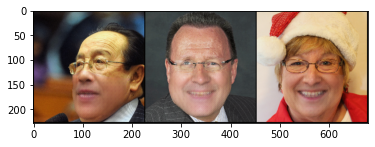

Epoch 1: Step 50982


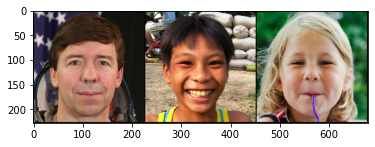

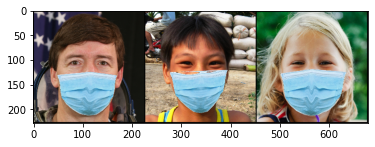

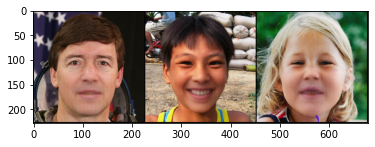

Epoch 1: Step 51861


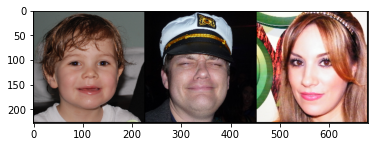

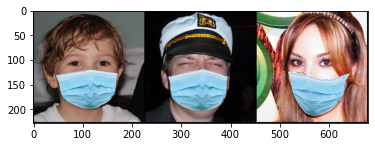

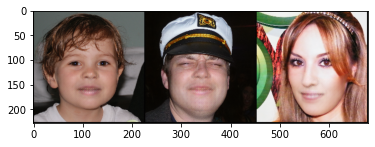

Epoch 1: Step 52740


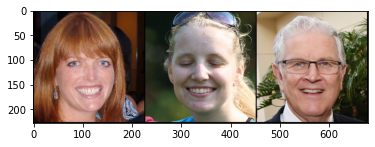

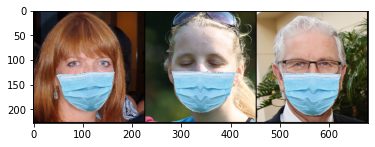

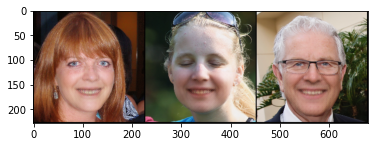

In [24]:
train(True)   #epoch15

  0%|          | 0/3517 [00:00<?, ?it/s]

Epoch 1: Step 53619


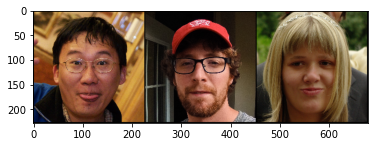

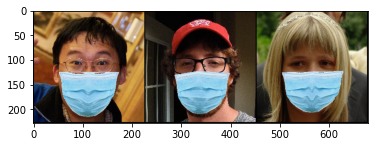

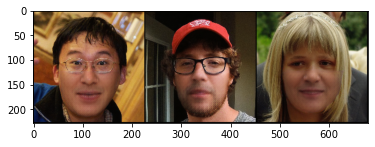

Epoch 1: Step 54498


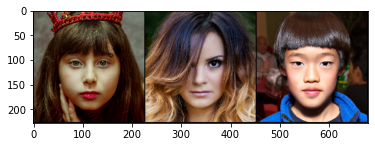

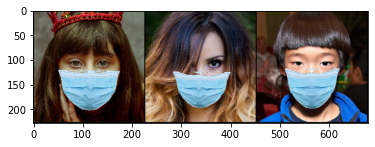

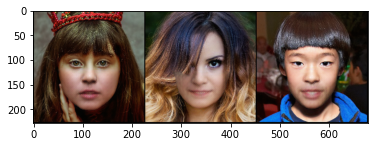

Epoch 1: Step 55377


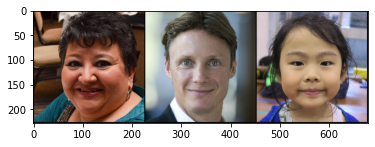

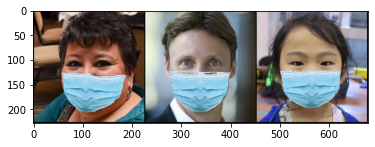

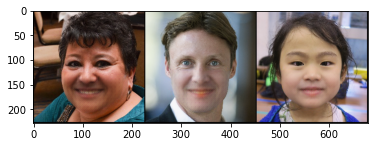

Epoch 1: Step 56256


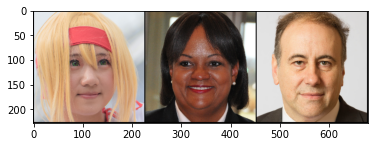

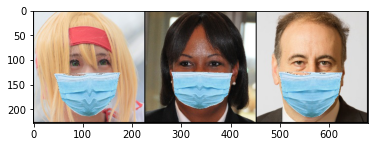

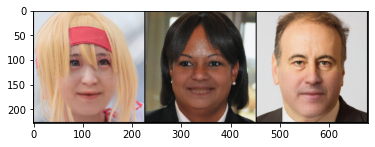

In [24]:
train(True)   #epoch16